In [1]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split

print("TensorFlow:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2025-11-26 22:41:45.092179: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764177105.163314   72724 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764177105.193020   72724 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1764177105.340078   72724 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764177105.340111   72724 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764177105.340113   72724 computation_placer.cc:177] computation placer alr

TensorFlow: 2.19.0
Num GPUs Available:  1


In [2]:
# PATH = "kaggle/input/csiro-biomass"
PATH = "dataset"
df = pd.read_csv(f"{PATH}/train.csv")

# We need to pivot on 'image_path' (or sample_id) and 'target_name'
pivot_df = df.pivot_table(index='image_path', columns='target_name', values='target').reset_index()
target_cols = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
pivot_df = pivot_df[['image_path'] + target_cols]

# train test split 17:3 ratio 
train_df, val_df = train_test_split(pivot_df, test_size=0.15, random_state=42)


In [3]:
# # Create TensorFlow Dataset
# IMG_SIZE = 412
# BATCH_SIZE = 8

# def load_image(path):
#     # Expand on this function MORE (image pre-processing here)
#     img = tf.io.read_file("/kaggle/input/csiro-biomass/" + path)
#     img = tf.image.decode_jpeg(img, channels=3)
#     img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
#     img = tf.cast(img, tf.float32) / 255.0  
#     return img


In [4]:
# Create TensorFlow Dataset
IMG_SIZE = 442
BATCH_SIZE = 8


# ------------------- COLOR FEATURES -------------------

def to_hsv(img):
    return tf.image.rgb_to_hsv(img)  # already 0–1


def to_lab(img):
    """ Full TF-SAFE RGB → LAB conversion with proper normalization """

    # ---- 1. RGB (0–1) → linear RGB ----
    mask = tf.cast(img > 0.04045, tf.float32)

    img_linear = (
        tf.pow((img + 0.055) / 1.055, 2.4) * mask +
        (img / 12.92) * (1.0 - mask)
    )

    # ---- 2. linear RGB → XYZ ----
    M = tf.constant([
        [0.4124, 0.3576, 0.1805],
        [0.2126, 0.7152, 0.0722],
        [0.0193, 0.1192, 0.9505]
    ], dtype=tf.float32)

    xyz = tf.tensordot(img_linear, M, axes=1)

    # Normalize by D65 white point
    xyz = xyz / tf.constant([0.95047, 1.0, 1.08883], tf.float32)

    eps = 0.008856
    k   = 903.3

    # ---- 3. XYZ → f(X), f(Y), f(Z) ----
    def f(t):
        return tf.where(t > eps, tf.pow(t, 1/3), (k * t + 16.0) / 116.0)

    fx = f(xyz[...,0])
    fy = f(xyz[...,1])
    fz = f(xyz[...,2])

    # ---- 4. LAB raw ----
    L = 116.0 * fy - 16.0   # 0–100
    A = 500.0 * (fx - fy)   # -128..128
    B = 200.0 * (fy - fz)   # -128..128

    # ---- 5. Normalize LAB channels ----
    L = L / 100.0           # 0–1
    A = A / 128.0           # -1..1
    B = B / 128.0           # -1..1

    return tf.stack([L, A, B], axis=-1)


def to_gray(img):
    return tf.image.rgb_to_grayscale(img)  # 0–1


# ------------------- VEGETATION INDICES -------------------

def ndvi_approx(img):
    r = img[...,0]
    g = img[...,1]
    nd = (g - r) / (g + r + 1e-6)
    return tf.clip_by_value(nd[..., None], -1.0, 1.0)


def exg(img):
    r,g,b = img[...,0], img[...,1], img[...,2]
    ex = 2*g - r - b
    return tf.clip_by_value(ex[..., None], -1.0, 1.0)


def gli(img):
    r,g,b = img[...,0], img[...,1], img[...,2]
    gl = (2*g - r - b) / (2*g + r + b + 1e-6)
    return tf.clip_by_value(gl[..., None], -1.0, 1.0)


# ------------------- MAIN LOADER -------------------

def load_image(path):
    img = tf.io.read_file(f"{PATH}/" + path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))

    # Normalize RGB to 0–1
    img = tf.cast(img, tf.float32) / 255.0

    # COLOR FEATURES
    hsv  = to_hsv(img)
    lab  = to_lab(img)
    gray = to_gray(img)

    # VEG INDICES
    nd   = ndvi_approx(img)
    eg   = exg(img)
    gl   = gli(img)

    # CONCAT all 13 channels
    out = tf.concat([img, hsv, lab, gray, nd, eg, gl], axis=-1)

    return out


In [5]:
import matplotlib.pyplot as plt

def create_dataset(dataframe, batch_size=BATCH_SIZE, shuffle=False):
    image_paths = dataframe['image_path'].values
    targets = dataframe[target_cols].values.astype(np.float32)

    ds = tf.data.Dataset.from_tensor_slices((image_paths, targets))

    def map_func(path, target):
        return load_image(path), target

    ds = ds.map(map_func, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        ds = ds.shuffle(buffer_size=1000)

    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds


# creating tensorflow dataset
train_ds = create_dataset(train_df, shuffle=True)
val_ds = create_dataset(val_df, shuffle=False)


I0000 00:00:1764177168.587417   72724 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5527 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


In [6]:
import matplotlib.pyplot as plt
import tensorflow as tf

def show_features(img_tensor):
    # Resize for display
    small = tf.image.resize(img_tensor, (256, 256))

    features = [
        ("ORIGINAL RGB", small[..., :3]),

        ("HSV - H", small[..., 3:4]),
        ("HSV - S", small[..., 4:5]),
        ("HSV - V", small[..., 5:6]),

        ("LAB - L", small[..., 6:7]),
        ("LAB - A", small[..., 7:8]),
        ("LAB - B", small[..., 8:9]),

        ("Grayscale", small[..., 9:10]),

        ("NDVI", small[..., 10:11]),
        ("ExG", small[..., 11:12]),
        ("GLI", small[..., 12:13]),
    ]

    cols = 4
    rows = (len(features) + cols - 1) // cols

    plt.figure(figsize=(14, rows * 3))

    for i, (title, fmap) in enumerate(features):
        ax = plt.subplot(rows, cols, i + 1)

        # RGB → show in color
        if fmap.shape[-1] == 3:
            plt.imshow(fmap.numpy())
        else:
            plt.imshow(fmap[..., 0].numpy(), cmap="gray")

        plt.title(title, fontsize=9)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


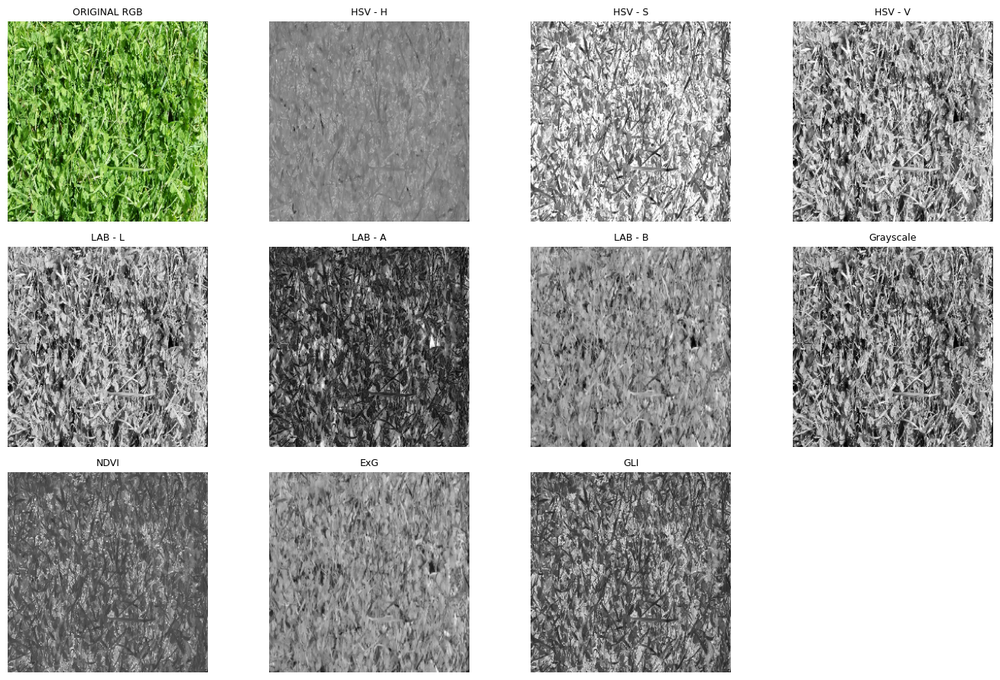

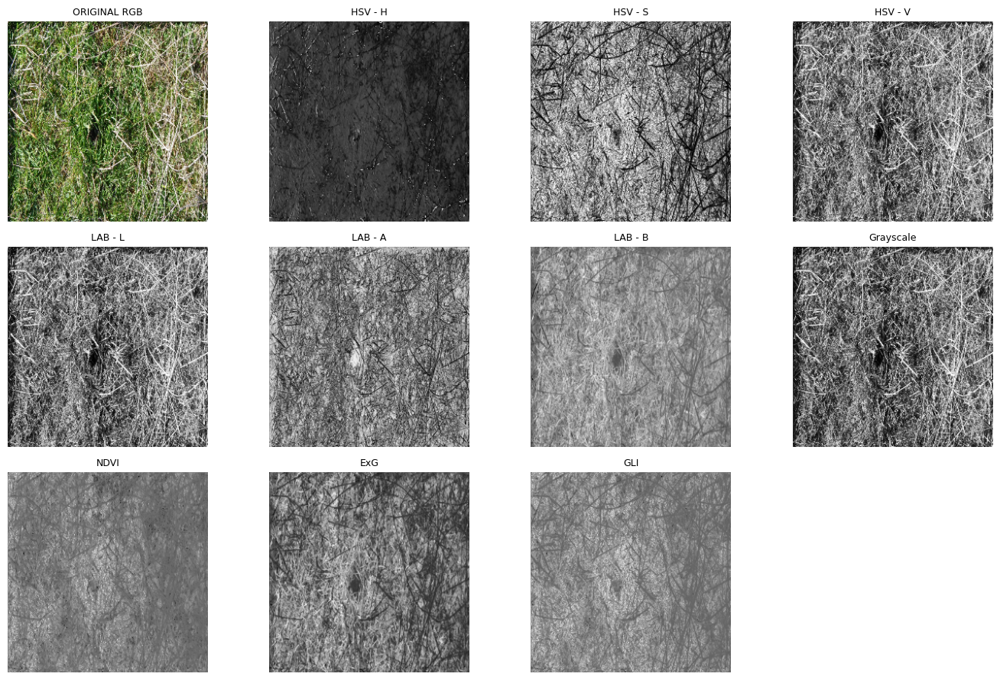

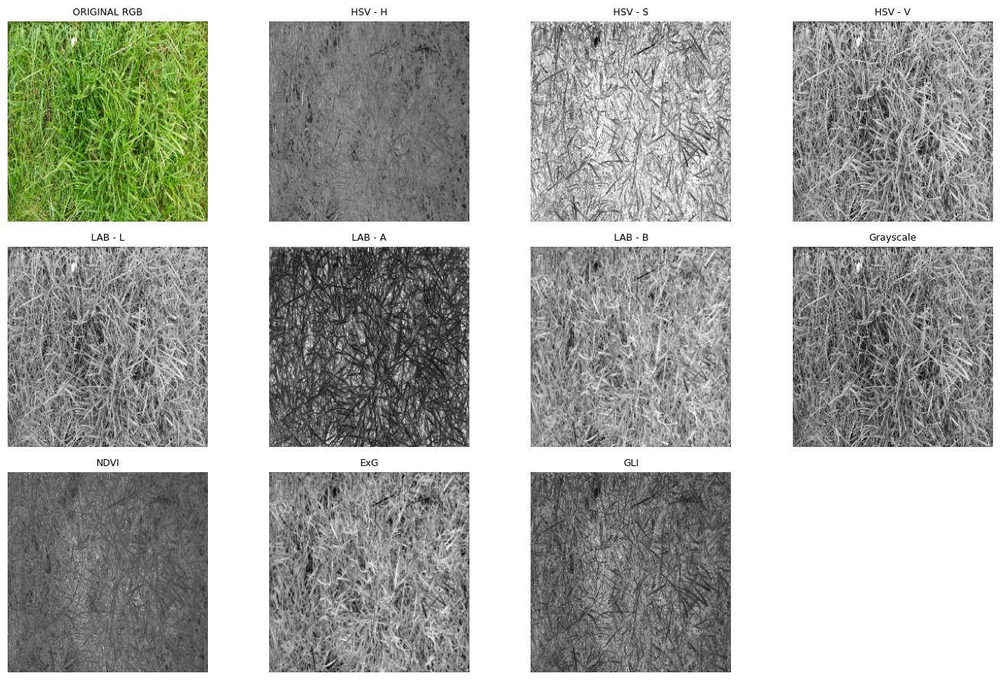

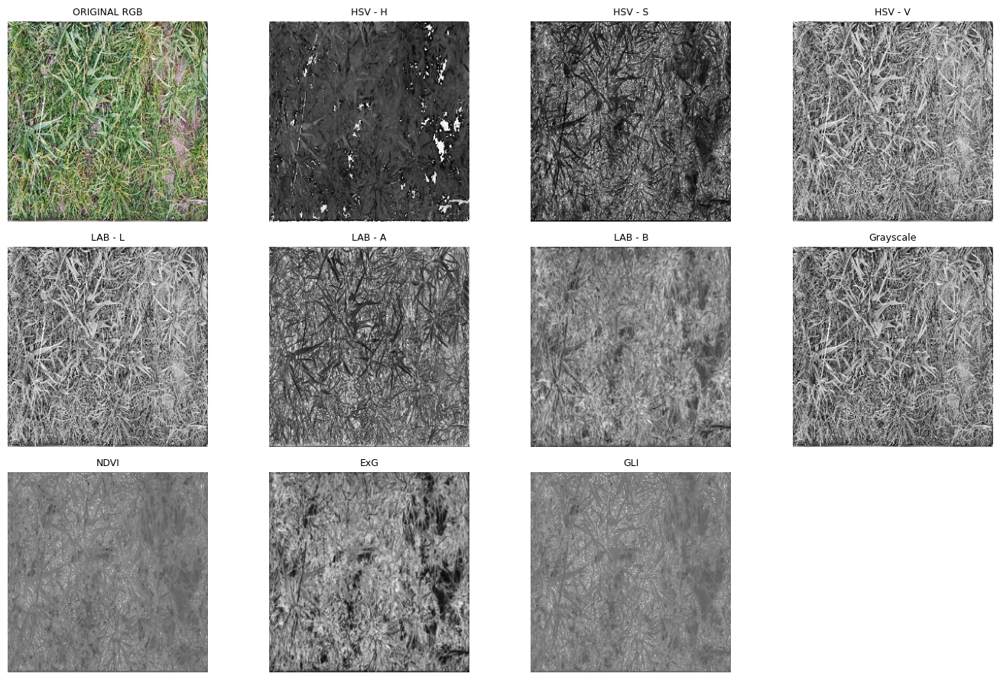

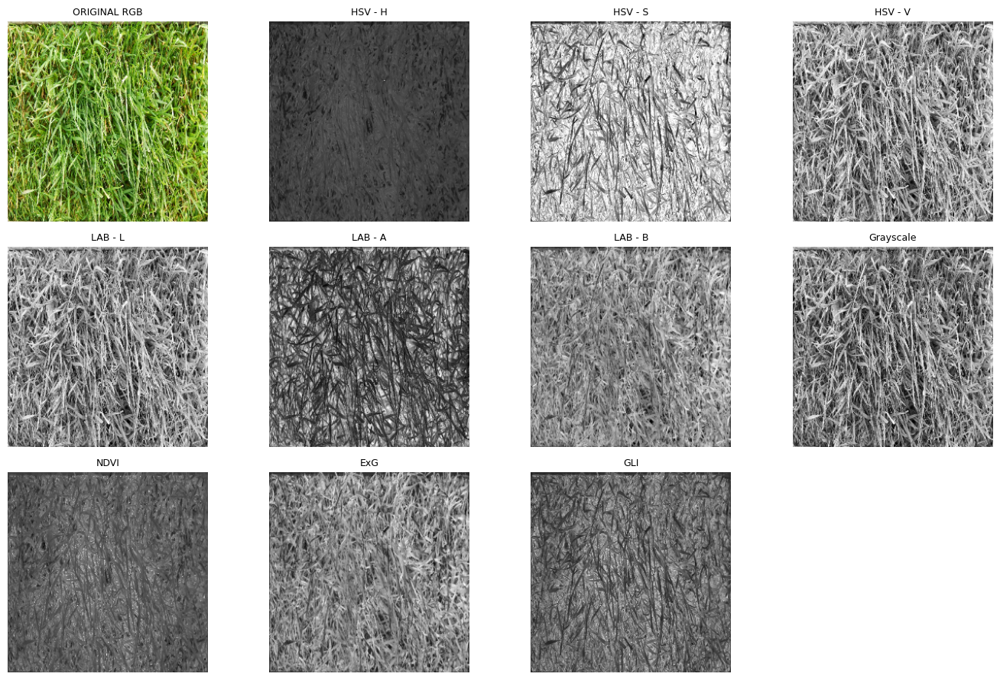

2025-11-26 22:42:59.336800: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [7]:
for img_batch, target_batch in train_ds.take(5):
    show_features(img_batch[0])

## BUILDING THE MODEL NOW

In [8]:
import tensorflow as tf
from tensorflow.keras.layers import (
    Conv2D, BatchNormalization, ReLU, Add, GlobalAveragePooling2D,
    Dense, Dropout, Input, Reshape, Multiply, MaxPooling2D
)
from tensorflow.keras.models import Model


# ------------------------------------------------------------
# Squeeze-Excitation (SE)
# ------------------------------------------------------------
def se_block(x, reduction=16):
    channels = x.shape[-1]
    se = GlobalAveragePooling2D()(x)
    se = Dense(max(channels // reduction, 4), activation="relu")(se)
    se = Dense(channels, activation="sigmoid")(se)
    se = Reshape((1, 1, channels))(se)
    return Multiply()([x, se])


# ------------------------------------------------------------
# Bottleneck Block (ResNet-50/101/152 family)
# ------------------------------------------------------------
def bottleneck_block(x, filters, stride=1):
    shortcut = x

    # 1x1 reduce
    y = Conv2D(filters, 1, strides=1, padding="same", use_bias=False)(x)
    y = BatchNormalization()(y)
    y = ReLU()(y)

    # 3x3 conv
    y = Conv2D(filters, 3, strides=stride, padding="same", use_bias=False)(y)
    y = BatchNormalization()(y)
    y = ReLU()(y)

    # 1x1 expand
    y = Conv2D(filters * 4, 1, strides=1, padding="same", use_bias=False)(y)
    y = BatchNormalization()(y)

    # shortcut alignment
    if stride != 1 or shortcut.shape[-1] != filters * 4:
        shortcut = Conv2D(filters * 4, 1, strides=stride, padding="same", use_bias=False)(shortcut)
        shortcut = BatchNormalization()(shortcut)

    # SE inside bottleneck
    y = se_block(y)

    out = Add()([shortcut, y])
    out = ReLU()(out)
    return out


# ------------------------------------------------------------
# Stage builder
# ------------------------------------------------------------
def make_stage(x, filters, blocks, stride):
    # First block (possibly downsampling)
    x = bottleneck_block(x, filters, stride)
    # Remaining blocks
    for _ in range(blocks - 1):
        x = bottleneck_block(x, filters, 1)
    return x


# ------------------------------------------------------------
# FINAL MODEL: SE-ResNet-101
# ------------------------------------------------------------
def build_improved_model(img_size=512):
    inputs = Input((img_size, img_size, CHANNELS))

    # ----- STEM -----
    x = Conv2D(64, 7, strides=2, padding="same", use_bias=False)(inputs)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = MaxPooling2D(pool_size=3, strides=2, padding="same")(x)

    # ----- RESNET-101 STAGES -----
    x = make_stage(x, 64, 3, stride=1)     # conv2_x
    x = make_stage(x, 128, 4, stride=2)    # conv3_x
    x = make_stage(x, 256, 23, stride=2)   # conv4_x (VERY HEAVY)
    x = make_stage(x, 512, 3, stride=2)    # conv5_x

    # Extra SE at top
    x = se_block(x)

    # ----- HEAD -----
    x = GlobalAveragePooling2D()(x)

    x = Dense(1024, activation="relu")(x)
    x = Dropout(0.30)(x)

    x = Dense(512, activation="relu")(x)
    x = Dropout(0.20)(x)

    x = Dense(256, activation="relu")(x)

    # Final regression outputs (float32 for mixed precision)
    outputs = Dense(5, dtype="float32")(x)

    model = Model(inputs, outputs)
    return model


# ---- Instantiate Model ----
IMG_SIZE = 442  # change freely; 384 or 448 recommended for ResNet-101
CHANNELS = 13
model = build_improved_model(IMG_SIZE)
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 442, 442,  │          0 │ -                 │
│ (InputLayer)        │ 13)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 221, 221,  │     40,768 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 221, 221,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 221, 221,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 111, 111,  │          0 │ re_lu[0][0]       │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 111, 111,  │      4,096 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 111, 111,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 111, 111,  │     36,864 │ re_lu_1[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 111, 111,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 111, 111,  │     16,384 │ re_lu_2[0][0]     │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │      1,024 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 256)       │          0 │ batch_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 16)        │      4,112 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 256)       │      4,352 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 111, 111,  │     16,384 │ max_pooling2d[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 50,696,629 (193.39 MB)

 Trainable params: 50,591,285 (192.99 MB)

 Non-trainable params: 105,344 (411.50 KB)

In [16]:
# model arch 
from tensorflow.keras.utils import plot_model
from IPython.display import Image, display

# plot_model(model, to_file="/home/vector/project/CSIRO---Image2Biomass-Prediction/model.png", show_shapes=True, show_layer_names=True)

# Image is wayy too long, working on notebook becomes difficult

# we will assign weights to the output parameters

In [9]:
import tensorflow.keras.backend as K

def weighted_r2(y_true, y_pred):
    weights = tf.constant([0.1, 0.1, 0.1, 0.2, 0.5], dtype=tf.float32)
    mean_y_true = K.mean(y_true, axis=0)
    tss = K.sum(K.square(y_true - mean_y_true), axis=0)
    rss = K.sum(K.square(y_true - y_pred), axis=0)
    r2_scores = 1 - (rss / (tss + K.epsilon()))
    return K.sum(r2_scores * weights)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='mse',
    metrics=['mae']
)


In [11]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'feature_extraction_v1.keras', 
    monitor='val_loss',
    mode='min',
    save_best_only=True,
    verbose=1
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=80,
    callbacks=[checkpoint]
)

Epoch 1/80
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - loss: 1087.1877 - mae: 22.4918
Epoch 1: val_loss improved from None to 1234.41479, saving model to feature_extraction_v1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 20s 464ms/step - loss: 1179.9822 - mae: 23.1543 - val_loss: 1234.4148 - val_mae: 24.7762
Epoch 2/80
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - loss: 1128.2954 - mae: 22.3081
Epoch 2: val_loss improved from 1234.41479 to 1177.21155, saving model to feature_extraction_v1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 23s 474ms/step - loss: 1081.0490 - mae: 21.7135 - val_loss: 1177.2115 - val_mae: 23.9627
Epoch 3/80
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step - loss: 805.8651 - mae: 18.5284
Epoch 3: val_loss improved from 1177.21155 to 1073.98987, saving model to feature_extraction_v1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 21s 476ms/step - loss: 911.1850 - mae: 19.4201 - val_loss: 1073.9899 - val_mae: 22.4813
Epoch 4/80
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step - loss: 633.2739 - mae: 16.0719
Epoch 4: val_lo

In [ ]:
# checkpoint = tf.keras.callbacks.ModelCheckpoint(
#     'feature_extraction_v1.keras', 
#     monitor='val_loss',
#     mode='min',
#     save_best_only=True,
#     verbose=1
# )

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=30,
    callbacks=[checkpoint]
)

ValueError: x and y must have same first dimension, but have shapes (80,) and (0,)

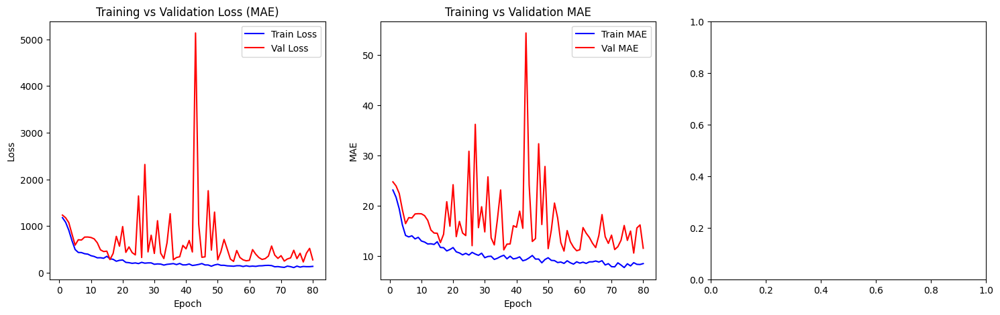

In [13]:
# import matplotlib.pyplot as plt

# def plot_history(history):
#     loss = history.history['loss']
#     val_loss = history.history['val_loss']
#     mae = history.history['mae']
#     val_mae = history.history['val_mae']
#     r2 = history.history['weighted_r2']
#     val_r2 = history.history['val_weighted_r2']
    
#     epochs = range(1, len(loss) + 1)
    
#     plt.figure(figsize=(18, 5))
    
#     # Plot Loss
#     plt.subplot(1, 3, 1)
#     plt.plot(epochs, loss, 'bo-', label='Training Loss')
#     plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
#     plt.title('Training and Validation Loss (MSE)')
#     plt.xlabel('Epochs')
#     plt.ylabel('Loss')
#     plt.legend()
    
#     # Plot MAE
#     plt.subplot(1, 3, 2)
#     plt.plot(epochs, mae, 'bo-', label='Training MAE')
#     plt.plot(epochs, val_mae, 'ro-', label='Validation MAE')
#     plt.title('Training and Validation MAE')
#     plt.xlabel('Epochs')
#     plt.ylabel('MAE')
#     plt.legend()
    
#     # Plot Weighted R2
#     plt.subplot(1, 3, 3)
#     plt.plot(epochs, r2, 'bo-', label='Training Weighted R2')
#     plt.plot(epochs, val_r2, 'ro-', label='Validation Weighted R2')
#     plt.title('Training and Validation Weighted R2')
#     plt.xlabel('Epochs')
#     plt.ylabel('Weighted R2')
#     plt.legend()
    
#     plt.tight_layout()
#     plt.show()

# plot_history(history)

import matplotlib.pyplot as plt

def plot_history(history):
    h = history.history
    
    loss      = h.get('loss', [])
    val_loss  = h.get('val_loss', [])
    mae       = h.get('mae', [])
    val_mae   = h.get('val_mae', [])
    r2        = h.get('weighted_r2', [])
    val_r2    = h.get('val_weighted_r2', [])
    
    epochs = range(1, len(loss) + 1)
    
    plt.figure(figsize=(18, 5))
    
    # ---------------- LOSS ----------------
    plt.subplot(1, 3, 1)
    plt.plot(epochs, loss, 'b-', label='Train Loss')
    plt.plot(epochs, val_loss, 'r-', label='Val Loss')
    plt.title('Training vs Validation Loss (MAE)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    # ---------------- MAE ----------------
    plt.subplot(1, 3, 2)
    plt.plot(epochs, mae, 'b-', label='Train MAE')
    plt.plot(epochs, val_mae, 'r-', label='Val MAE')
    plt.title('Training vs Validation MAE')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.legend()
    
    # ---------------- R2 ----------------
    plt.subplot(1, 3, 3)
    plt.plot(epochs, r2, 'b-', label='Train R2')
    plt.plot(epochs, val_r2, 'r-', label='Val R2')
    plt.title('Training vs Validation Weighted R2')
    plt.xlabel('Epoch')
    plt.ylabel('Weighted R2')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

plot_history(history)


In [ ]:
# model.save("model7_v5.h5")

Generating predictions for validation set...


2025-11-26 23:15:33.334899: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Overall Weighted R2 Score: 0.3296
Component R2 Scores:
  Dry_Green_g    : 0.4190
  Dry_Dead_g     : 0.0050
  Dry_Clover_g   : 0.1750
  GDM_g          : 0.5424
  Dry_Total_g    : 0.3225

Visualizing 5 random samples...


TypeError: Invalid shape (442, 442, 13) for image data

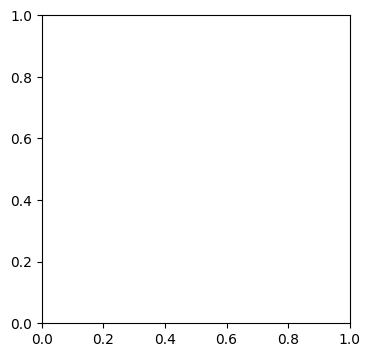

In [12]:
import matplotlib.pyplot as plt
import numpy as np

def evaluate_and_visualize(model, val_ds, num_samples=5):
    # 1. Get all predictions and true values
    all_images = []
    all_targets = []
    all_preds = []
    
    print("Generating predictions for validation set...")
    # Unbatch the /kaggle/input/csiro-biomass to process all samples
    for images, targets in val_ds:
        preds = model.predict(images, verbose=0)
        all_images.append(images.numpy())
        all_targets.append(targets.numpy())
        all_preds.append(preds)
        
    # Concatenate batches
    all_images = np.concatenate(all_images, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    all_preds = np.concatenate(all_preds, axis=0)
    
    # 2. Calculate Overall Weighted R2
    weights = np.array([0.1, 0.1, 0.1, 0.2, 0.5])
    
    mean_true = np.mean(all_targets, axis=0)
    tss = np.sum((all_targets - mean_true)**2, axis=0)
    rss = np.sum((all_targets - all_preds)**2, axis=0)
    
    # Avoid division by zero
    r2_scores = 1 - (rss / (tss + 1e-7))
    weighted_r2 = np.sum(r2_scores * weights)
    
    print(f"\nOverall Weighted R2 Score: {weighted_r2:.4f}")
    print(f"Component R2 Scores:")
    target_names = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
    for name, score in zip(target_names, r2_scores):
        print(f"  {name:<15}: {score:.4f}")
        
    # 3. Visualize Samples
    print(f"\nVisualizing {num_samples} random samples...")
    indices = np.random.choice(len(all_images), num_samples, replace=False)
    
    for idx in indices:
        img = all_images[idx]
        true = all_targets[idx]
        pred = all_preds[idx]
        
        plt.figure(figsize=(12, 4))
        
        # Image
        plt.subplot(1, 2, 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title("Input Image")
        
        # Table of values
        plt.subplot(1, 2, 2)
        plt.axis('off')
        
        # Header
        text_str = f"{'Component':<15} | {'True':>6} | {'Pred':>6} | {'Diff':>6}\n"
        text_str += "-"*45 + "\n"
        
        # Rows
        for i, name in enumerate(target_names):
            diff = pred[i] - true[i]
            text_str += f"{name:<15} | {true[i]:6.1f} | {pred[i]:6.1f} | {diff:6.1f}\n"
            
        plt.text(0, 0.5, text_str, fontsize=12, family='monospace', va='center')
        plt.tight_layout()
        plt.show()

# Run evaluation
evaluate_and_visualize(model, val_ds)


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os

def generate_submission(model):
    print("Loading test data...")
    test_df = pd.read_csv("/kaggle/input/csiro-biomass/test.csv")
    
    # Get unique images to predict on
    unique_images = test_df['image_path'].unique()
    print(f"Found {len(unique_images)} unique test images.")
    
    # Create /kaggle/input/csiro-biomass
    def load_image(path):
        # Check if path exists
        full_path = "/kaggle/input/csiro-biomass/" + path
        img = tf.io.read_file(full_path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
        img = tf.cast(img, tf.float32) / 255.0
        return img

    test_ds = tf.data.Dataset.from_tensor_slices(unique_images)
    test_ds = test_ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    
    print("Predicting...")
    # Predict
    predictions = model.predict(test_ds, verbose=1)
    
    # Map predictions to image paths
    # predictions shape: (N_images, 5)
    # Target order: ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
    target_cols = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
    
    # Create a lookup dictionary: image_path -> {target_name: value}
    pred_dict = {}
    for img_path, pred_row in zip(unique_images, predictions):
        pred_dict[img_path] = {col: val for col, val in zip(target_cols, pred_row)}
        
    print("Formatting submission...")
    # Create submission rows
    submission_rows = []
    for index, row in test_df.iterrows():
        img_path = row['image_path']
        target_name = row['target_name']
        sample_id = row['sample_id']
        
        # Get prediction
        if img_path in pred_dict:
            pred_value = pred_dict[img_path][target_name]
        else:
            # Fallback if something went wrong (shouldn't happen)
            pred_value = 0.0
        
        # Ensure non-negative (biomass can't be negative)
        pred_value = max(0.0, pred_value)
        
        submission_rows.append({'sample_id': sample_id, 'target': pred_value})
        
    submission_df = pd.DataFrame(submission_rows)
    
    # Save to CSV
    output_file = "submission.csv"
    submission_df.to_csv(output_file, index=False)
    print(f"Saved submission to {output_file}")
    
    # Print the content for user to copy if needed
    print("\n" + "="*20 + " SUBMISSION CSV CONTENT " + "="*20)
    print(submission_df.to_csv(index=False))
    print("="*64)

# Run generation
generate_submission(model)
